# Calculates and plot UHI annual cycles and anomaly climatology for Paris

## Load libraries

Here we load the required libraries to execute the notebook. Note that specific code from dedicated scripts (`utils.py`, `urban_areas.py`, ...) is also loaded here.

In [93]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [94]:
!echo $CONDA_DEFAULT_ENV

jsc


In [95]:
import os

import pandas as pd
import numpy as np
from urclimask.GHCNd_stations import get_valid_timeseries, inside_city
from urclimask.UHI_analysis import UrbanIsland
from urclimask.urban_areas import UrbanVicinity
from urclimask.utils import load_ucdb_city, traverseDir

In [96]:
import matplotlib.pyplot as plt

In [97]:
from tools import (
    check_equal_period,
    fix_360_longitudes,
    open_datasets,
    standardize_unit,
)

In [98]:
import xarray as xr

In [91]:
import sys

In [92]:
save_results_path = os.path.abspath(
    os.path.join(os.getcwd(), "..", "intermediate-results")
)
save_figure_path = os.path.abspath(os.path.join(os.getcwd(), "..", "plots"))
save_results_path = os.path.abspath(
    os.path.join(os.getcwd(), "..", "intermediate-results")
)
save_figure_path = os.path.abspath(os.path.join(os.getcwd(), "..", "plots"))
save_figure_dataset = os.path.abspath(os.path.join(os.getcwd(), "..", "datasets"))

# CORDEX-EUR-CMIP6

In [66]:
city = "Paris"

domain = "EUR-11"
model = "REMO"
scenario = "evaluation"

urban_var = "sfturf"

urban_th = 40
urban_sur_th = 5
orog_diff = 100
sftlf_th = 70
ratio_r2u = 2
min_city_size = 30
lon_lim = 1
lat_lim = 1
height_station = 100

variable = "sfcWind"
period_star = "1991"
period_stop = "2020"
period = slice(period_star, period_stop)

domain_resolution = int(domain.split("-")[1])

In [67]:
import yaml

# Cargar el archivo YAML
with open("cities.yaml", "r") as f:
    cities = yaml.safe_load(f)
lat_city = cities[city]["lat"]
lon_city = cities[city]["lon"]

if cities[city].get("urban_th") is not None:
    urban_th = cities[city].get("urban_th")

if cities[city].get("orog_diff") is not None:
    orog_diff= cities[city].get("orog_diff")

if cities[city].get("height_station") is not None:
    height_station= cities[city].get("height_station")

# CMIP6

In [68]:
mip_era = "CMIP6"
driving_source_id = "ERA5"
frequency = "mon"#1hr/mon

In [69]:
dsets = open_datasets(
    [variable],
    frequency=frequency,
    driving_source_id=driving_source_id,
    mask=True,
    add_missing_bounds=False,
    source_id =['RACMO23E', 'ICON-CLM-202407-1-1', 'CCLM6-0-1-URB', 'HCLIM43-ALADIN', 'ROAM-NBS', 'REMO2020-2-2-iMOVE-LUC', 'REMO2020-2-2-MR2', 'REMO2020-2-2-TEB', 'REMO2020-2-2', 'REMO2020-2-2-iMOVE', 'WRF451Q', 'CNRM-ALADIN64E1', 'RegCM5-0', 'ALARO1-SFX']

)

Opening catalog from https://raw.githubusercontent.com/euro-cordex/joint-evaluation/refs/heads/main/CORDEX-CMIP6.json
Found 14 datasets for variables ['sfcWind']: ['RACMO23E', 'ICON-CLM-202407-1-1', 'CCLM6-0-1-URB', 'HCLIM43-ALADIN', 'ROAM-NBS', 'REMO2020-2-2-iMOVE-LUC', 'REMO2020-2-2-MR2', 'REMO2020-2-2-TEB', 'REMO2020-2-2', 'REMO2020-2-2-iMOVE', 'WRF451Q', 'CNRM-ALADIN64E1', 'RegCM5-0', 'ALARO1-SFX']

--> The keys in the returned dictionary of datasets are constructed as follows:
	'project_id.domain_id.institution_id.driving_source_id.driving_experiment_id.driving_variant_label.source_id.version_realization.frequency.version'


decoding dataset CORDEX-CMIP6.EUR-12.CLMcom-CMCC.ERA5.evaluation.r1i1p1f1.CCLM6-0-1-URB.v1-r1.fx.v20250201
Found 30 datasets
decoding dataset CORDEX-CMIP6.EUR-12.IDL-FCUL.ERA5.evaluation.r1i1p1f1.WRF451Q.v1-r1.fx.v20240630
Warning for CORDEX-CMIP6.EUR-12.IDL-FCUL.ERA5.evaluation.r1i1p1f1.WRF451Q.v1-r1.fx.v20240630: Variable(s) referenced in cell_measures not in variables: ['areacella']
Warning for CORDEX-CMIP6.EUR-12.IDL-FCUL.ERA5.evaluation.r1i1p1f1.WRF451Q.v1-r1.fx.v20240630: Variable(s) referenced in cell_measures not in variables: ['areacella']
Warning for CORDEX-CMIP6.EUR-12.IDL-FCUL.ERA5.evaluation.r1i1p1f1.WRF451Q.v1-r1.fx.v20240630: Variable(s) referenced in cell_measures not in variables: ['areacella']
Found 30 datasets
decoding dataset CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-TEB.v1-r1.fx.v20251028
Found 30 datasets
decoding dataset CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-iMOVE-LUC.v1-r1.fx.v20250515
Warning for CORDEX-CMIP6.EU

/home/yquintana/.conda/envs/jsc/lib/python3.10/site-packages/evaltools/fix.py:88: UserWarning: Grid mapping has (198.0, 39.25) which is inconsistent with (-162.0, 39.25) for EUR-12 and CORDEX-CMIP6.EUR-12.ICTP.ERA5.evaluation.r1i1p1f1.RegCM5-0.v1-r1.fx.v20250415.
  warnings.warn(message)
/home/yquintana/.conda/envs/jsc/lib/python3.10/site-packages/evaltools/fix.py:88: UserWarning: Grid mapping has (198.0, 39.25) which is inconsistent with (-162.0, 39.25) for EUR-12 and CORDEX-CMIP6.EUR-12.ICTP.ERA5.evaluation.r1i1p1f1.RegCM5-0.v1-r1.mon.v20250415.
  warnings.warn(message)
/home/yquintana/.conda/envs/jsc/lib/python3.10/site-packages/evaltools/fix.py:88: UserWarning: Grid mapping has (18.0, 39.25) which is inconsistent with (-162.0, 39.25) for EUR-12 and CORDEX-CMIP6.EUR-12.AUTH.ERA5.evaluation.r1i1p1f1.WRF451Q.v1-r3.mon.v20250630.
  warnings.warn(message)


merging CORDEX-CMIP6.EUR-12.CLMcom-CMCC.ERA5.evaluation.r1i1p1f1.CCLM6-0-1-URB.v1-r1.mon.v20250201 with CORDEX-CMIP6.EUR-12.CLMcom-CMCC.ERA5.evaluation.r1i1p1f1.CCLM6-0-1-URB.v1-r1.fx.v20250201
merging CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-iMOVE-LUC.v1-r1.mon.v20250515 with CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-iMOVE-LUC.v1-r1.fx.v20250515
merging CORDEX-CMIP6.EUR-12.ICTP.ERA5.evaluation.r1i1p1f1.RegCM5-0.v1-r1.mon.v20250415 with CORDEX-CMIP6.EUR-12.ICTP.ERA5.evaluation.r1i1p1f1.RegCM5-0.v1-r1.fx.v20250415
merging CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-MR2.v1-r1.mon.v20241120 with CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-MR2.v1-r1.fx.v20241120
merging CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-iMOVE.v1-r1.mon.v20250515 with CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-iMOVE.v1-r1.fx.v20250515
merging CORDEX-CMIP6.EUR-12.DWD-BSH.ERA5.evaluatio

In [70]:
# delete simulatios with not urban static variable
to_delete = [dset for dset, ds in dsets.items() if urban_var not in ds.variables]

for dset in to_delete:
    del dsets[dset]

In [71]:
for dset in dsets.keys():
    #dsets[dset] = dsets[dset].sel(time=period).compute()
    dsets[dset] = dsets[dset].sel(time=period)

In [72]:
for dset in dsets.keys():
    if not check_equal_period(dsets[dset], period):
        print(f"Temporal coverage of {dset} does not match with {period}")

Temporal coverage of CORDEX-CMIP6.EUR-12.ICTP.ERA5.evaluation.r1i1p1f1.RegCM5-0.v1-r1.mon.v20250415 does not match with slice('1991', '2020', None)


## Define urban areas and vicinity

In [73]:
### Load city shapefile
root_aux_data = "/mnt/CORDEX_CMIP6_tmp/aux_data/"
ucdb_city = load_ucdb_city(root_aux_data, city)

### Load static variables
Load static variables, such as urban fraction (sfturf), terrain elevation (orography) or land-sea fraction (sftlf).

In [74]:
keys = [k for k in dsets.keys()]

In [75]:
keys

['CORDEX-CMIP6.EUR-12.CLMcom-CMCC.ERA5.evaluation.r1i1p1f1.CCLM6-0-1-URB.v1-r1.mon.v20250201',
 'CORDEX-CMIP6.EUR-12.ICTP.ERA5.evaluation.r1i1p1f1.RegCM5-0.v1-r1.mon.v20250415',
 'CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-MR2.v1-r1.mon.v20241120',
 'CORDEX-CMIP6.EUR-12.DWD-BSH.ERA5.evaluation.r1i1p1f1.ROAM-NBS.v1-r1.mon.v20240920',
 'CORDEX-CMIP6.EUR-12.RMIB-UGent.ERA5.evaluation.r1i1p1f1.ALARO1-SFX.v1-r1.mon.v20241009',
 'CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-TEB.v1-r1.mon.v20251028',
 'CORDEX-CMIP6.EUR-12.CLMcom-Hereon.ERA5.evaluation.r1i1p1f1.ICON-CLM-202407-1-1.v1-r1.mon.v20240920',
 'CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2.v1-r1.mon.v20241120',
 'CORDEX-CMIP6.EUR-12.KNMI.ERA5.evaluation.r1i1p1f1.RACMO23E.v1-r1.mon.v20241216',
 'CORDEX-CMIP6.EUR-12.HCLIMcom-SMHI.ERA5.evaluation.r1i1p1f1.HCLIM43-ALADIN.v1-r1.mon.v20241205']

In [76]:
if city == 'Paris':
    var_map = {
        'tas': 'TAVG',
        'tasmin': 'TMIN',
        'tasmax': 'TMAX',
        'pr': 'PRCP',
        'sfcWind': 'SNWD',
        'hurs': 'U'
    }
else:
    var_map = {
        'tasmin': 'tasmin',
        'tasmax': 'tasmax',
        'pr': 'pr',
        'sfcWind': 'sfcWind',
        'hurs': 'hurs'
    }

In [77]:
root = "/mnt/CORDEX_CMIP6_tmp/aux_data/PARIS_surface_weather_data/"
files_obs_paris = list(traverseDir(root, '.csv'))
files_obs_paris = [f for f in files_obs_paris if "198001" in f]


df_all = []
for file in files_obs_paris:

    if variable == 'pr':
        var_paris = 'RR1'
    elif variable == 'tas':
        var_paris = 'T'
    elif variable == 'tasmax':
        var_paris = 'T'
    elif variable == 'tasmin':
        var_paris = 'T'
    elif variable == 'sfcWind':
        var_paris = 'FF'
    elif variable == 'hurs':
        var_paris = 'U'
    
    df = pd.read_csv(
        file,
        sep=";",
        decimal=",",
        na_values=["", " "]
    )


    df["date"] = pd.to_datetime(df["DATE"], format="%Y%m%d%H")
    df.set_index("date", inplace=True)
    df = df.sort_index()
    df.drop(columns=['DATE'], inplace=True)

    df_var = pd.DataFrame(index = df.index)
    df_var[var_map.get(variable, None)] = df[var_paris]
    df_var['NAME'] = file.split('/')[-1].split('_')[-1].split('.csv')[0]
    df_var['code'] = df['POSTE'].values
    df_var['code'] = df_var['code'].astype(int)

    df_all.append(df_var)


df_obs_Paris = pd.concat(df_all)


/tmp/ipykernel_2820018/890889989.py:22: DtypeWarning: Columns (3,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2820018/890889989.py:22: DtypeWarning: Columns (3,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2820018/890889989.py:22: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2820018/890889989.py:22: DtypeWarning: Columns (3,7,9,11,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2820018/890889989.py:22: DtypeWarning: Columns (3,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2820018/890889989.py:22: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_282001

In [78]:
if city == 'Paris':
    
    root = "/mnt/CORDEX_CMIP6_tmp/aux_data/PARIS_surface_weather_data/"
    files_obs_paris = list(traverseDir(root, '.csv'))
    files_obs_paris = [f for f in files_obs_paris if "198001" in f]
    
    df_all = []
    for file in files_obs_paris:
    
        if variable == 'pr':
            var_paris = 'RR1'
        elif variable in ['tas', 'tasmax', 'tasmin']:
            var_paris = 'T'
        elif variable == 'sfcWind':
            var_paris = 'FF'
    
        df = pd.read_csv(
            file,
            sep=";",
            decimal=",",
            na_values=["", " "]
        )
    
        df["DATE"] = pd.to_datetime(df["DATE"], format="%Y%m%d%H")
        df.set_index("DATE", inplace=True)
        df = df.sort_index()
    
        # Extrae código de estación
        station_code = df["POSTE"].iloc[0]
        station_name = file.split('/')[-1].split('_')[-1].split('.csv')[0]
    
        if variable == 'tasmax':
            df_daily = df[[var_paris]].resample("D").max()
        elif variable == 'tasmin':
            df_daily = df[[var_paris]].resample("D").min()
        else:
            df_daily = df[[var_paris]]
    
        df_var = pd.DataFrame(index=df_daily.index)
        df_var[var_map.get(variable, None)] = df_daily[var_paris]
        df_var["NAME"] = station_name
        df_var["code"] = station_code
    
        df_all.append(df_var)
    
    df_obs = pd.concat(df_all)


/tmp/ipykernel_2820018/1441144266.py:17: DtypeWarning: Columns (3,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2820018/1441144266.py:17: DtypeWarning: Columns (3,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2820018/1441144266.py:17: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2820018/1441144266.py:17: DtypeWarning: Columns (3,7,9,11,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2820018/1441144266.py:17: DtypeWarning: Columns (3,13) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_2820018/1441144266.py:17: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(
/tmp/ipykernel_

## Calculate UHI and plots for each models

CORDEX-CMIP6.EUR-12.CLMcom-CMCC.ERA5.evaluation.r1i1p1f1.CCLM6-0-1-URB.v1-r1.mon.v20250201
Paris -- PARIS-MONTSOURIS - SNWD has 2067.2% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - SNWD has 2051.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - SNWD has 2049.3% valid records in 1991-01-01 to 2020-12-31
Paris -- TRAPPES - SNWD has 2122.3% valid records in 1991-01-01 to 2020-12-31
Paris -- VILLACOUBLAY - SNWD has 2039.3% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - SNWD has 2047.1% valid records in 1991-01-01 to 2020-12-31
Paris -- BRETIGNY-SAPC - SNWD has 1501.7% valid records in 1991-01-01 to 2020-12-31
Paris -- SAINT-MAUR - SNWD has 2009.2% valid records in 1991-01-01 to 2020-12-31
Paris -- ROISSY - SNWD has 2052.9% valid records in 1991-01-01 to 2020-12-31


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


There are 3 series inside the city and 6 outside
CORDEX-CMIP6.EUR-12.ICTP.ERA5.evaluation.r1i1p1f1.RegCM5-0.v1-r1.mon.v20250415


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- PARIS-MONTSOURIS - SNWD has 2067.2% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - SNWD has 2051.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - SNWD has 2049.3% valid records in 1991-01-01 to 2020-12-31
Paris -- TRAPPES - SNWD has 2122.3% valid records in 1991-01-01 to 2020-12-31
Paris -- VILLACOUBLAY - SNWD has 2039.3% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - SNWD has 2047.1% valid records in 1991-01-01 to 2020-12-31
Paris -- BRETIGNY-SAPC - SNWD has 1501.7% valid records in 1991-01-01 to 2020-12-31
Paris -- SAINT-MAUR - SNWD has 2009.2% valid records in 1991-01-01 to 2020-12-31
Paris -- ROISSY - SNWD has 2052.9% valid records in 1991-01-01 to 2020-12-31


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


There are 3 series inside the city and 6 outside
CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-MR2.v1-r1.mon.v20241120


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- PARIS-MONTSOURIS - SNWD has 2067.2% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - SNWD has 2051.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - SNWD has 2049.3% valid records in 1991-01-01 to 2020-12-31
Paris -- TRAPPES - SNWD has 2122.3% valid records in 1991-01-01 to 2020-12-31
Paris -- VILLACOUBLAY - SNWD has 2039.3% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - SNWD has 2047.1% valid records in 1991-01-01 to 2020-12-31
Paris -- BRETIGNY-SAPC - SNWD has 1501.7% valid records in 1991-01-01 to 2020-12-31
Paris -- SAINT-MAUR - SNWD has 2009.2% valid records in 1991-01-01 to 2020-12-31
Paris -- ROISSY - SNWD has 2052.9% valid records in 1991-01-01 to 2020-12-31


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


There are 3 series inside the city and 6 outside
CORDEX-CMIP6.EUR-12.DWD-BSH.ERA5.evaluation.r1i1p1f1.ROAM-NBS.v1-r1.mon.v20240920


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- PARIS-MONTSOURIS - SNWD has 2067.2% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - SNWD has 2051.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - SNWD has 2049.3% valid records in 1991-01-01 to 2020-12-31
Paris -- TRAPPES - SNWD has 2122.3% valid records in 1991-01-01 to 2020-12-31
Paris -- VILLACOUBLAY - SNWD has 2039.3% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - SNWD has 2047.1% valid records in 1991-01-01 to 2020-12-31
Paris -- BRETIGNY-SAPC - SNWD has 1501.7% valid records in 1991-01-01 to 2020-12-31
Paris -- SAINT-MAUR - SNWD has 2009.2% valid records in 1991-01-01 to 2020-12-31
Paris -- ROISSY - SNWD has 2052.9% valid records in 1991-01-01 to 2020-12-31


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


There are 3 series inside the city and 6 outside
CORDEX-CMIP6.EUR-12.RMIB-UGent.ERA5.evaluation.r1i1p1f1.ALARO1-SFX.v1-r1.mon.v20241009


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- PARIS-MONTSOURIS - SNWD has 2067.2% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - SNWD has 2051.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - SNWD has 2049.3% valid records in 1991-01-01 to 2020-12-31
Paris -- TRAPPES - SNWD has 2122.3% valid records in 1991-01-01 to 2020-12-31
Paris -- VILLACOUBLAY - SNWD has 2039.3% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - SNWD has 2047.1% valid records in 1991-01-01 to 2020-12-31
Paris -- BRETIGNY-SAPC - SNWD has 1501.7% valid records in 1991-01-01 to 2020-12-31
Paris -- SAINT-MAUR - SNWD has 2009.2% valid records in 1991-01-01 to 2020-12-31
Paris -- ROISSY - SNWD has 2052.9% valid records in 1991-01-01 to 2020-12-31


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


There are 3 series inside the city and 6 outside
CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2-TEB.v1-r1.mon.v20251028


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:449: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(2, 3, subplot_kw={'projection': proj}, figsize=(20, 10))


Paris -- PARIS-MONTSOURIS - SNWD has 2067.2% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - SNWD has 2051.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - SNWD has 2049.3% valid records in 1991-01-01 to 2020-12-31
Paris -- TRAPPES - SNWD has 2122.3% valid records in 1991-01-01 to 2020-12-31
Paris -- VILLACOUBLAY - SNWD has 2039.3% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - SNWD has 2047.1% valid records in 1991-01-01 to 2020-12-31
Paris -- BRETIGNY-SAPC - SNWD has 1501.7% valid records in 1991-01-01 to 2020-12-31
Paris -- SAINT-MAUR - SNWD has 2009.2% valid records in 1991-01-01 to 2020-12-31
Paris -- ROISSY - SNWD has 2052.9% valid records in 1991-01-01 to 2020-12-31


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


There are 3 series inside the city and 6 outside
CORDEX-CMIP6.EUR-12.CLMcom-Hereon.ERA5.evaluation.r1i1p1f1.ICON-CLM-202407-1-1.v1-r1.mon.v20240920


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- PARIS-MONTSOURIS - SNWD has 2067.2% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - SNWD has 2051.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - SNWD has 2049.3% valid records in 1991-01-01 to 2020-12-31
Paris -- TRAPPES - SNWD has 2122.3% valid records in 1991-01-01 to 2020-12-31
Paris -- VILLACOUBLAY - SNWD has 2039.3% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - SNWD has 2047.1% valid records in 1991-01-01 to 2020-12-31
Paris -- BRETIGNY-SAPC - SNWD has 1501.7% valid records in 1991-01-01 to 2020-12-31
Paris -- SAINT-MAUR - SNWD has 2009.2% valid records in 1991-01-01 to 2020-12-31
Paris -- ROISSY - SNWD has 2052.9% valid records in 1991-01-01 to 2020-12-31


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


There are 3 series inside the city and 6 outside
CORDEX-CMIP6.EUR-12.GERICS.ERA5.evaluation.r1i1p1f1.REMO2020-2-2.v1-r1.mon.v20241120


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- PARIS-MONTSOURIS - SNWD has 2067.2% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - SNWD has 2051.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - SNWD has 2049.3% valid records in 1991-01-01 to 2020-12-31
Paris -- TRAPPES - SNWD has 2122.3% valid records in 1991-01-01 to 2020-12-31
Paris -- VILLACOUBLAY - SNWD has 2039.3% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - SNWD has 2047.1% valid records in 1991-01-01 to 2020-12-31
Paris -- BRETIGNY-SAPC - SNWD has 1501.7% valid records in 1991-01-01 to 2020-12-31
Paris -- SAINT-MAUR - SNWD has 2009.2% valid records in 1991-01-01 to 2020-12-31
Paris -- ROISSY - SNWD has 2052.9% valid records in 1991-01-01 to 2020-12-31
There are 3 series inside the city and 6 outside


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


CORDEX-CMIP6.EUR-12.KNMI.ERA5.evaluation.r1i1p1f1.RACMO23E.v1-r1.mon.v20241216


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- PARIS-MONTSOURIS - SNWD has 2067.2% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - SNWD has 2051.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - SNWD has 2049.3% valid records in 1991-01-01 to 2020-12-31
Paris -- TRAPPES - SNWD has 2122.3% valid records in 1991-01-01 to 2020-12-31
Paris -- VILLACOUBLAY - SNWD has 2039.3% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - SNWD has 2047.1% valid records in 1991-01-01 to 2020-12-31
Paris -- BRETIGNY-SAPC - SNWD has 1501.7% valid records in 1991-01-01 to 2020-12-31
Paris -- SAINT-MAUR - SNWD has 2009.2% valid records in 1991-01-01 to 2020-12-31
Paris -- ROISSY - SNWD has 2052.9% valid records in 1991-01-01 to 2020-12-31


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


There are 3 series inside the city and 6 outside
CORDEX-CMIP6.EUR-12.HCLIMcom-SMHI.ERA5.evaluation.r1i1p1f1.HCLIM43-ALADIN.v1-r1.mon.v20241205


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/urban_areas.py:153: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  cleaned_mask = morphology.remove_small_objects(labeled_mask, min_size=self.min_city_size)


Paris -- PARIS-MONTSOURIS - SNWD has 2067.2% valid records in 1991-01-01 to 2020-12-31
Paris -- MELUN - SNWD has 2051.9% valid records in 1991-01-01 to 2020-12-31
Paris -- TOUSSUS-LE-NOBLE - SNWD has 2049.3% valid records in 1991-01-01 to 2020-12-31
Paris -- TRAPPES - SNWD has 2122.3% valid records in 1991-01-01 to 2020-12-31
Paris -- VILLACOUBLAY - SNWD has 2039.3% valid records in 1991-01-01 to 2020-12-31
Paris -- ORLY - SNWD has 2047.1% valid records in 1991-01-01 to 2020-12-31
Paris -- BRETIGNY-SAPC - SNWD has 1501.7% valid records in 1991-01-01 to 2020-12-31
Paris -- SAINT-MAUR - SNWD has 2009.2% valid records in 1991-01-01 to 2020-12-31
Paris -- ROISSY - SNWD has 2052.9% valid records in 1991-01-01 to 2020-12-31


/mnt/CORDEX_CMIP6_tmp/user_tmp/yquintana/urclimask/urclimask/GHCNd_stations.py:211: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'True' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  valid_obs.loc[valid_obs['code'].str.contains(obs.code), 'inside_city'] = is_inside.values[0]


There are 3 series inside the city and 6 outside


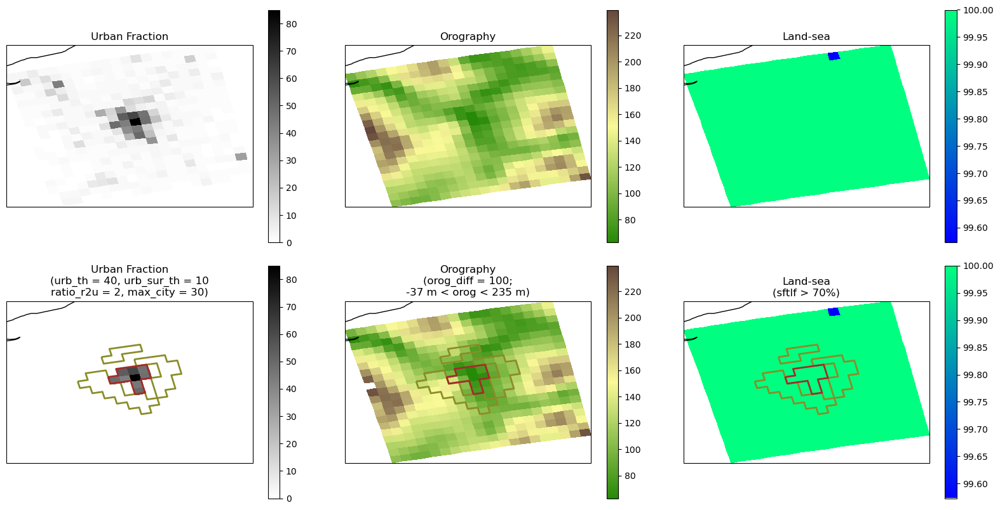

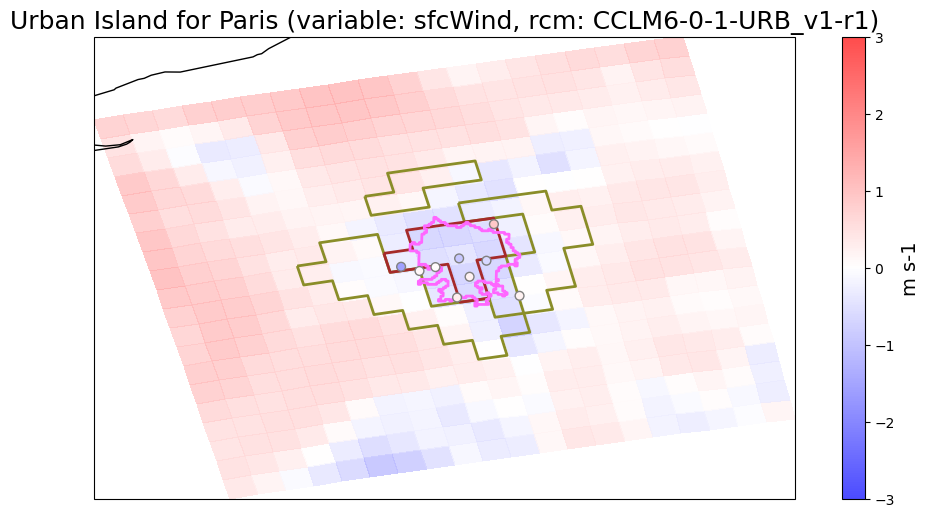

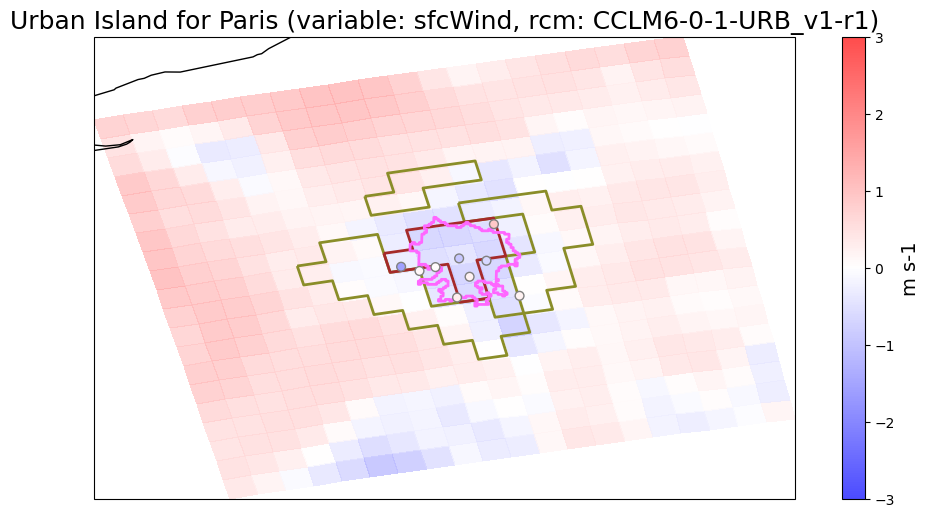

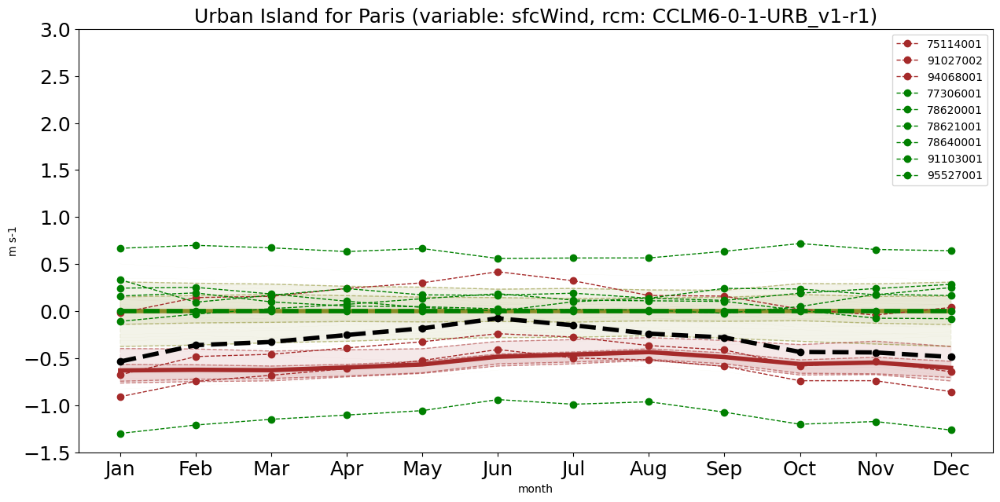

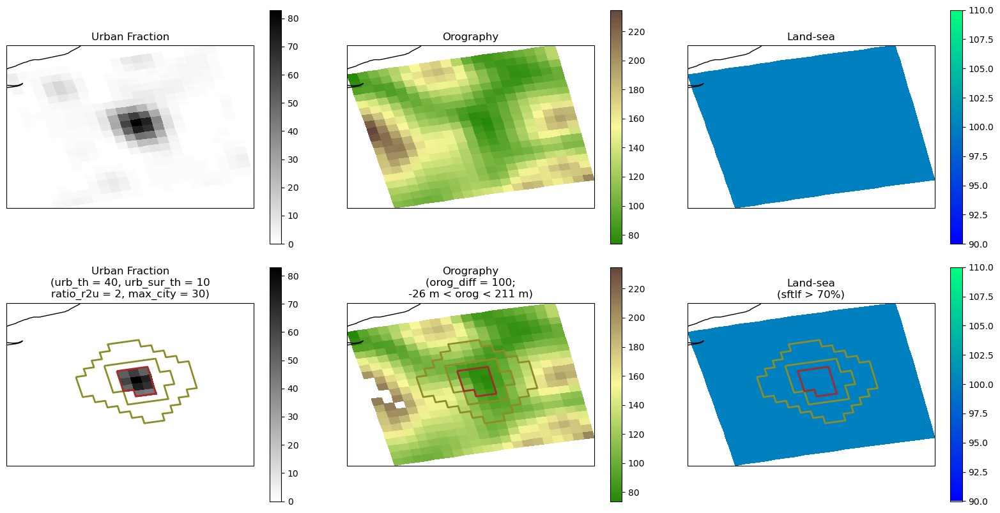

...

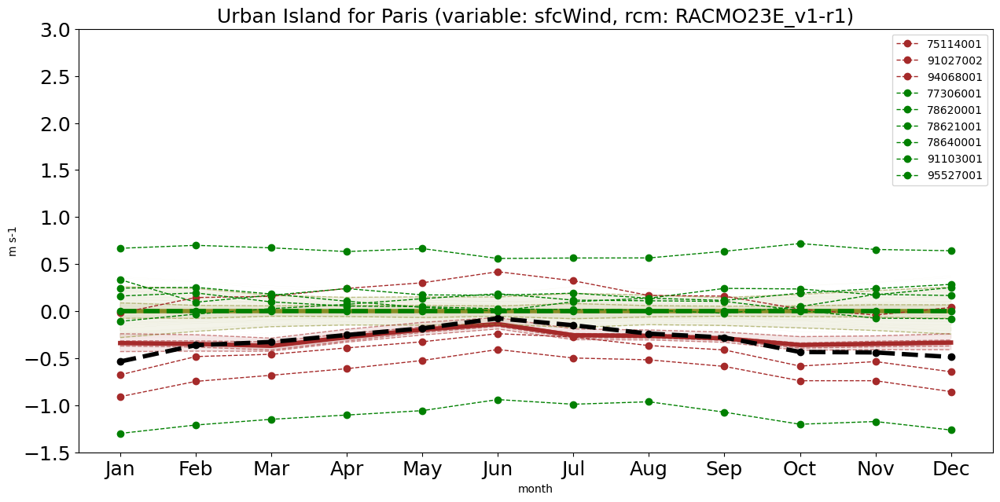

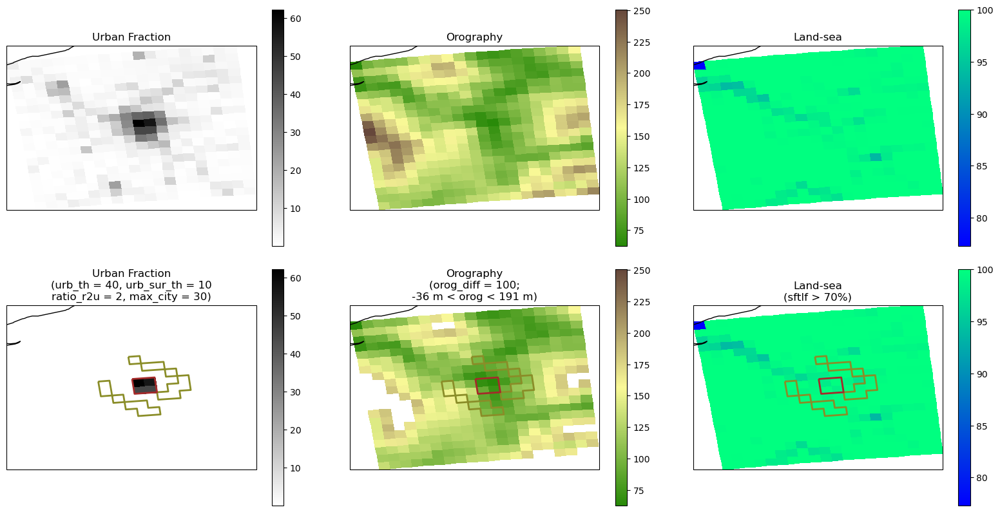

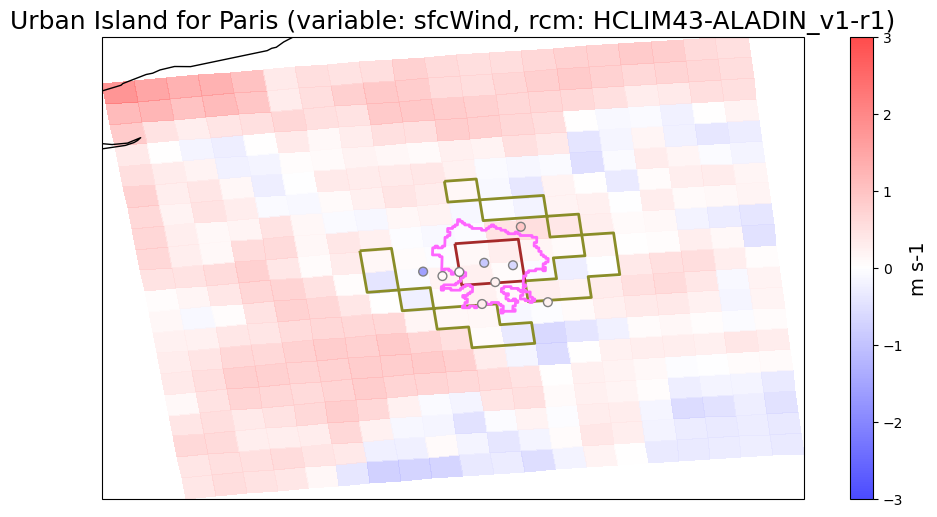

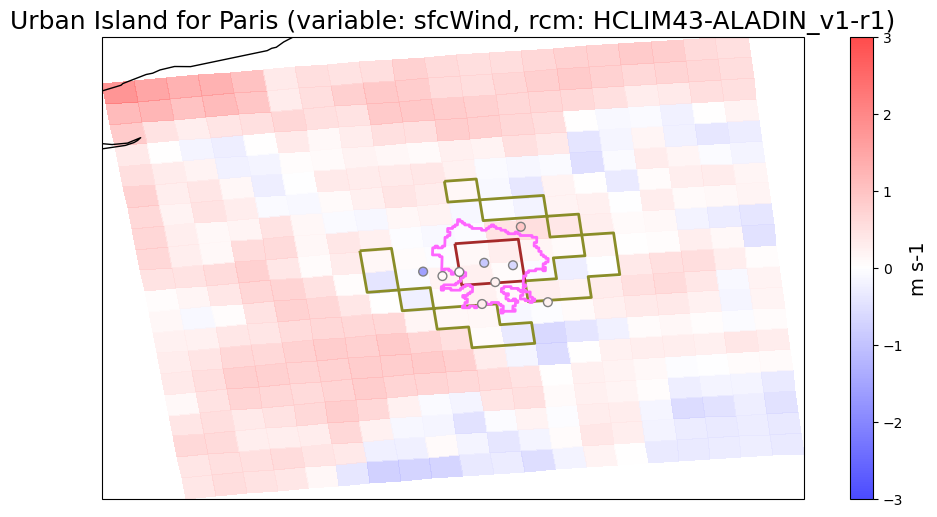

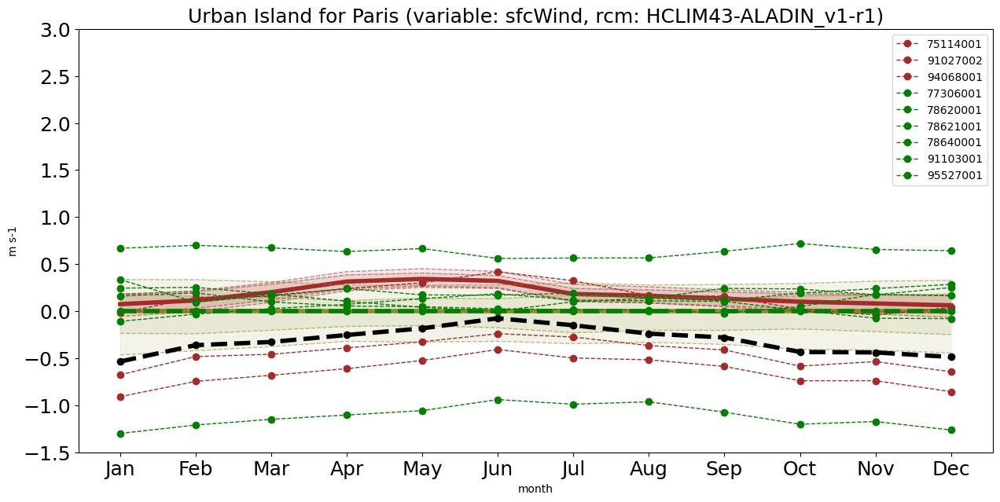

In [79]:
rcm_names = []
for dset, ds in dsets.items():

    print(dset)

    ds = fix_360_longitudes(ds, lonname="lon")

    ds_sfturf = ds[[urban_var]].compute()
    ds_orog = ds[["orog"]].compute()
    ds_sftlf = ds[["sftlf"]].compute()
    try:
        rcm_name = ds.attrs["model_id"] + "_" + ds.attrs["rcm_version_id"]
    except Exception:
        rcm_name = ds.attrs["source_id"] + "_" + ds.attrs["version_realization"]

    rcm_names.append(rcm_name)

    # Add parameters to the function
    URBAN = UrbanVicinity(
        urban_sur_th=urban_sur_th,
        orog_diff=orog_diff,
        sftlf_th=sftlf_th,
        ratio_r2u=ratio_r2u,
        min_city_size=min_city_size,
        lon_city=lon_city,
        lat_city=lat_city,
        lon_lim=lon_lim,
        lat_lim=lat_lim,
        model=model,
        domain=domain,
        urban_th=urban_th,
        urban_var=urban_var,
    )

    # Crop area around de city
    ds_sfturf = URBAN.crop_area_city(ds=ds_sfturf, res=domain_resolution)
    ds_orog = URBAN.crop_area_city(ds=ds_orog, res=domain_resolution)
    ds_sftlf = URBAN.crop_area_city(ds=ds_sftlf, res=domain_resolution)
    # Define masks using the parameters above
    sfturf_mask, sfturf_sur_mask, orog_mask, sftlf_mask = URBAN.define_masks(
        ds_sfturf=ds_sfturf,
        ds_orog=ds_orog,
        ds_sftlf=ds_sftlf,
    )
    # Define rural vicinity areas
    urmask = URBAN.select_urban_vicinity(
        sfturf_mask=sfturf_mask,
        orog_mask=orog_mask,
        sftlf_mask=sftlf_mask,
        sfturf_sur_mask=sfturf_sur_mask,
    )

    
    output_urmask_nc_path = f"{save_figure_dataset}/CMIP6_{city}_urmask_{rcm_name}.nc"
    if not os.path.exists(output_urmask_nc_path):
        urmask.to_netcdf(output_urmask_nc_path)
    # We can plot the masks and the urban vs vicinity areas. The latter are are passed via the `urban_areas` parameter. They are hidden if set to `None`.
    fig = URBAN.plot_static_variables(
        ds_sfturf=ds_sfturf,
        ds_orog=ds_orog,
        ds_sftlf=ds_sftlf,
        sfturf_mask=sfturf_mask,
        orog_mask=orog_mask,
        sftlf_mask=sftlf_mask,
        urban_areas=urmask,
    )
    plt.savefig(
        f"{save_figure_path}/CMIP6_Paris_static_{variable}_{rcm_name}.png",
        bbox_inches="tight",
    )

    ## Calculate Urban Heat Island (UHI)
    ds_RCM = ds[[variable]]
    ds_RCM = URBAN.crop_area_city(ds=ds_RCM, res=domain_resolution)

    # Load obs data
    output_file = "/mnt/CORDEX_CMIP6_tmp/aux_data/PARIS_surface_weather_data/Data_MF_1980-2017.csv"
    radious = 0.6
    stan_data = pd.read_csv(output_file)
    stan_data["code"] = stan_data["code"].astype(str)
    stan_data = stan_data.loc[stan_data["dist"] < radious]
    
    valid_obs, time_series_obs, ds_RCM_period = get_valid_timeseries(
        city,
        stan_data,
        ds_RCM,
        df_obs_Paris,
        variable,
        idate="1991-01-01",
        fdate="2020-12-31",
        var_map = var_map,
        divide=1,
    )
    
    valid_obs = inside_city(valid_obs, ucdb_city)

    if variable == 'pr':
        valid_obs = pd.DataFrame()
        time_series_obs = pd.DataFrame()
        anomaly = 'rel'
        vmax = 25
        vmin = -25
        
    if variable in ["tasmax", "tasmin", "tas", 'sfcWind', 'hurs']:
        anomaly = 'abs'
        vmax = 3
        vmin = -1.5

    if frequency == '1hr':
        if variable == 'tasmax':
            ds_RCM_day= ds_RCM.resample('D').max()
        elif variable == 'tasmin':
            ds_RCM_day = ds_RCM.resample('D').min()
        elif variable in ['tas', 'pr']:
            ds_RCM_day = ds_RCM.copy()
    elif frequency in ['day', 'mon', 'sfcWind']:
        ds_RCM_day = ds_RCM.copy()

    if pd.infer_freq(time_series_obs.index) == 'h':
        if variable == 'tasmax':
            time_series_obs_day= time_series_obs.resample('D').max()
        elif variable == 'tasmin':
            time_series_obs_day = time_series_obs.resample('D').min()
        elif variable in ['tas', 'pr', 'sfcWind', 'hurs']:
            time_series_obs_day = time_series_obs.copy()
            
    if pd.infer_freq(time_series_obs.index) == 'd':
        time_series_obs_day = time_series_obs.copy()
    
    ### Compute the annual cycle climatology of anomalies with respect to rural vicinity mean
    UHI = UrbanIsland(
        ds=ds_RCM_day[variable],
        urban_vicinity=urmask,
        rcm=rcm_name,
        anomaly=anomaly,
        obs_attributes=valid_obs,
        obs_timeseries=time_series_obs_day,
    )
    ## Plot the data
    fig = UHI.plot_UI_map(city_name=city, ucdb_city=ucdb_city, vmax=vmax)

    plt.savefig(
        f"{save_figure_path}/CMIP6_Paris_UHI_map_{variable}_{rcm_name}_{period.start}-{period.stop}.png",
        bbox_inches="tight",
    )

    # --- Initialize UrbanIsland class ---
    UHI = UrbanIsland(
        ds=ds_RCM[variable],
        urban_vicinity=urmask,
        rcm=rcm_name,
        anomaly=anomaly,
        obs_attributes=valid_obs,
        obs_timeseries=time_series_obs,
    )

    # --- Plot UHI map ---
    fig = UHI.plot_UI_map(city_name=city, ucdb_city=ucdb_city, vmax=vmax)
    plt.savefig(
        f"{save_figure_path}/CMIP6_{city}_UHI_map_{variable}_{rcm_name}_{period.start}-{period.stop}.png",
        bbox_inches="tight",
    )

    # --- Compute annual cycle climatology ---
    UHI.compute_annual_cycle()

    # --- Save output NetCDF and CSV if available ---
    output_nc_path = f"{save_figure_dataset}/CMIP6_{city}_Annual_cycle_{variable}_{rcm_name}_{period.start}-{period.stop}.nc"
    output_obs_nc_path = f"{save_figure_dataset}/CMIP6_{city}_Annual_cycle_{variable}_OBS_{period.start}-{period.stop}.csv"

    # Save model annual cycle only if file does not already exist
    if not os.path.exists(output_nc_path):
        if hasattr(UHI, "ds_annual_cycle") and UHI.ds_annual_cycle is not None:
            UHI.ds_annual_cycle.to_netcdf(output_nc_path)

    # Save observed annual cycle if available
    if hasattr(UHI, "obs_annual_cycle") and UHI.obs_annual_cycle is not None:
        try:
            UHI.obs_annual_cycle.to_csv(output_obs_nc_path)
        except Exception as e:
            print(f"Could not save observational cycle: {e}")

    # --- Plot annual cycle figure ---
    fig = UHI.plot_UI_annual_cycle(
        percentiles=[5, 25],
        gridcell_series=True,
        city_name=city,
        vmax=vmax,
        vmin=vmin,
    )
    plt.savefig(
        f"{save_figure_path}/CMIP6_{city}_Annual_cycle_{variable}_{rcm_name}_{period.start}-{period.stop}.png",
        bbox_inches="tight",
    )
    
    #fig = UHI.plot_daily_cycle(percentiles=[5, 25], gridcell_series=True, city_name=city, ucdb_city=ucdb_city, vmax=vmax)
    #plt.savefig(
    #    f"{save_figure_path}/CMIP6_Paris_Daily_cycle_{variable}_{rcm_name}_{period.start}-{period.stop}.png",
    #    bbox_inches="t

### Unifying Model Figures

This section is dedicated to **merging all individual figures/plots from different models into a single, comprehensive visualization** for comparative analysis.

In [80]:
rcm_names = np.sort(rcm_names)

In [81]:
from PIL import Image

imgs = [
    Image.open(
        f"{save_figure_path}/CMIP6_Paris_UHI_map_{variable}_{rcm_name}_{period.start}-{period.stop}.png"
    )
    for rcm_name in rcm_names
    
]
imgs = [img.crop(img.getbbox()) for img in imgs]

w, h = imgs[0].size
final_img = Image.new("RGB", (1 * w, len(imgs) * h), "white")

for n_i, img in enumerate(imgs):
    final_img.paste(img, (0, n_i * h))

final_img.save(
    f"{save_figure_path}/CMIP6_Paris_UHI_map_{variable}_{period.start}-{period.stop}.png"
)

In [82]:
from PIL import Image

imgs = [
    Image.open(
        f"{save_figure_path}/CMIP6_Paris_Annual_cycle_{variable}_{rcm_name}_{period.start}-{period.stop}.png"
    )
    for rcm_name in rcm_names
]
imgs = [img.crop(img.getbbox()) for img in imgs]

w, h = imgs[0].size
final_img = Image.new("RGB", (1 * w, len(imgs) * h), "white")

for n_i, img in enumerate(imgs):
    final_img.paste(img, (0, n_i * h))

final_img.save(
    f"{save_figure_path}/CMIP6_Paris_Annual_cycle_{variable}_{period.start}-{period.stop}.png"
)

In [83]:
img1 = Image.open(
    f"{save_figure_path}/CMIP6_Paris_UHI_map_{variable}_{period.start}-{period.stop}.png"
)
img2 = Image.open(
    f"{save_figure_path}/CMIP6_Paris_Annual_cycle_{variable}_{period.start}-{period.stop}.png"
)

img1 = img1.crop(img1.getbbox())
img2 = img2.crop(img2.getbbox())

w1, h1 = img1.size
w2, h2 = img2.size

new_w2 = int(w2 * h1 / h2)
img2 = img2.resize((new_w2, h1), Image.LANCZOS)

final_img = Image.new("RGB", (w1 + w2, h1), "white")

final_img.paste(img1, (0, 0))
final_img.paste(img2, (w1, 0))

final_img.save(
    f"{save_figure_path}/CMIP6_Paris_{variable}_{period.start}-{period.stop}.png"
)

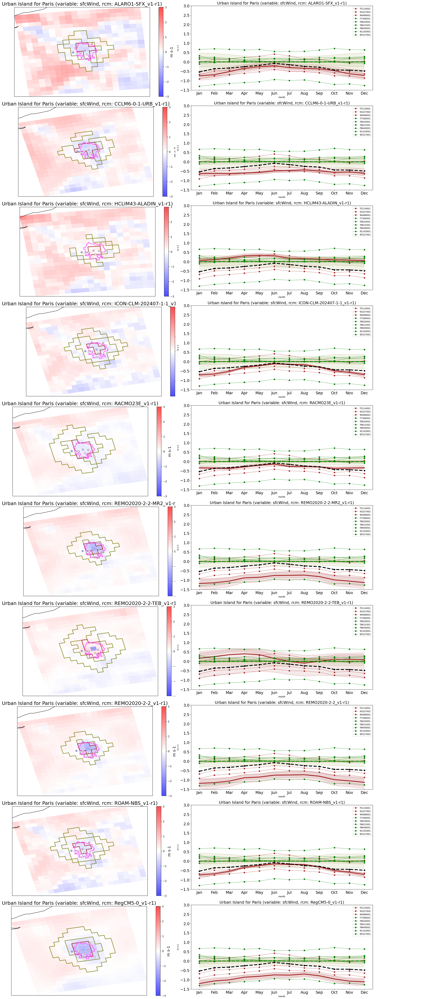

In [84]:
final_img